In [1]:
import os, glob
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

## Gather all images for counting
* Put them in a list called *image_paths*

In [2]:
def get_image_files(directory, extensions=[".jpg", ".jpeg", ".png"]):
    image_files = []
    
    for root, dirs, files in os.walk(directory):
        if "untreated" in dirs:
            dirs.remove("untreated")  # Exclude the "untreated" subdirectory from further traversal

        for file in files:
            if any(file.lower().endswith(ext) for ext in extensions):
                image_files.append(os.path.join(root, file))
    
    return image_files

In [3]:
directory_path = "images"
image_paths = get_image_files(directory_path)

## Colony count
* Use the function *count_classes* to get number of colonies
* This uses the model in *model_path*, which must have a single class called *colony*

In [4]:
model_path = "model/runs/detect/train10/weights/last.pt"

In [5]:
def count_classes(model_path, image_path):
  model = YOLO(model_path)

  img = cv2.imread(image_path)
  rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  H, W, _ = img.shape

  results = model(img, conf = 0.2, iou = 0.7)
  result = results[0]
  res_plotted = result.plot()

  f, axarr = plt.subplots(1,2)
  axarr[0].imshow(rgb)
  axarr[0].set_title('Photo')
  axarr[1].imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
  axarr[1].set_title('Results')

  names = results[0].names

  number_instances = np.zeros((len(names)), dtype = int)
  for i in range(0, len(results[0])):
    box = result.boxes[i]
    class_id = int(box.cls[0].item())
    number_instances[class_id] = number_instances[class_id] + 1

  counting = {}
  for i in range(0, len(names)):
    class_name = names.get(i)
    counting[class_name] = number_instances[i]

  return counting

In [6]:
for img_path in image_paths:
    date = img_path.split("/")[1]
    img_filename = img_path.split("/")[2]
    img_filename = img_filename.split('.')[0]
    img_filename = img_filename.split(' ')[0]
    strain = img_filename.split("_")[0]
    timePoint = img_filename.split("_")[1]
    dilutionFactorString = img_filename.split("_")[2]
    inoculationConcentration = img_filename.split("_")[3] if len(img_filename.split("_"))>=4 else np.nan
    #print(img_filename, img_filename.split('_'), inoculationConcentration)

## Pipeline


0: 480x640 37 colonys, 83.8ms
Speed: 9.8ms preprocess, 83.8ms inference, 12.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 44 colonys, 58.7ms
Speed: 1.6ms preprocess, 58.7ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 16 colonys, 59.3ms
Speed: 1.7ms preprocess, 59.3ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 12 colonys, 53.5ms
Speed: 1.9ms preprocess, 53.5ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 640x480 7 colonys, 79.5ms
Speed: 1.3ms preprocess, 79.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 4 colonys, 48.6ms
Speed: 1.4ms preprocess, 48.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 44 colonys, 50.6ms
Speed: 1.3ms preprocess, 50.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 2 colonys, 51.5ms
Speed: 1.7ms preprocess, 51.5ms inference, 0.4ms postprocess per image at s

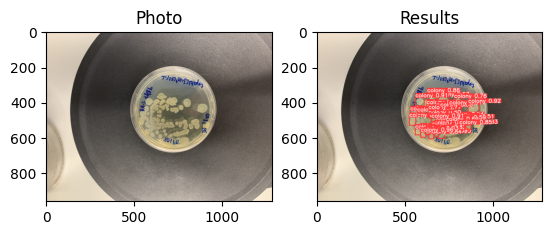

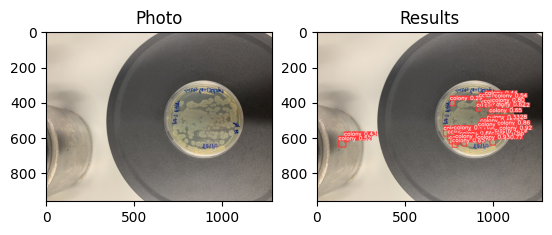

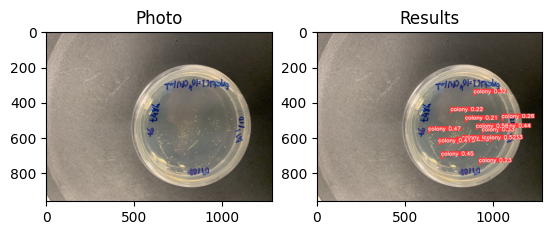

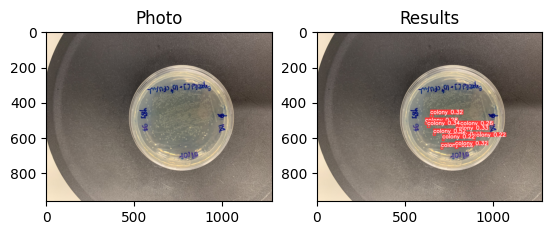

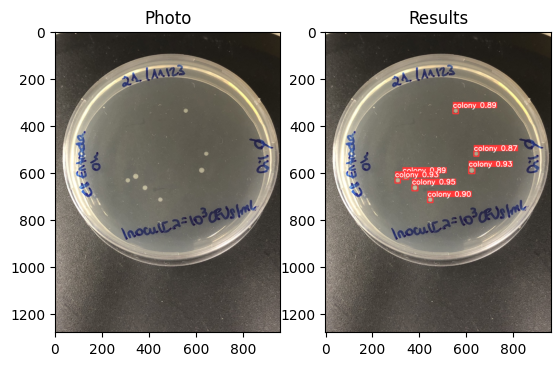

...

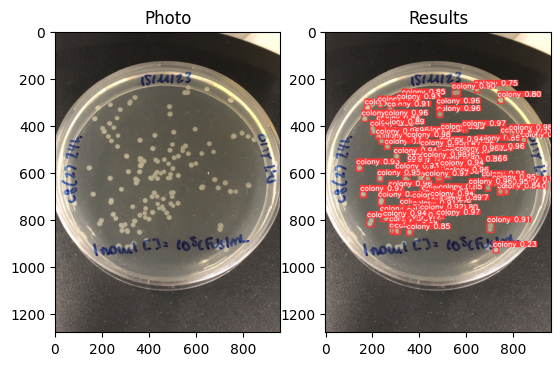

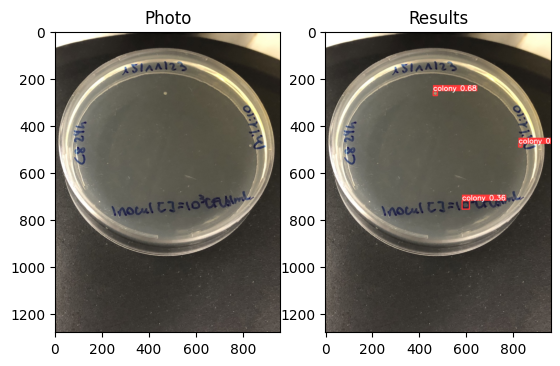

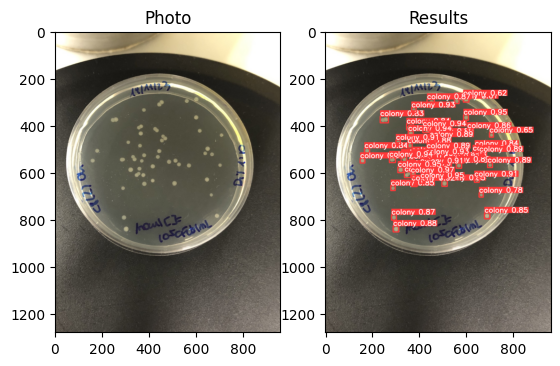

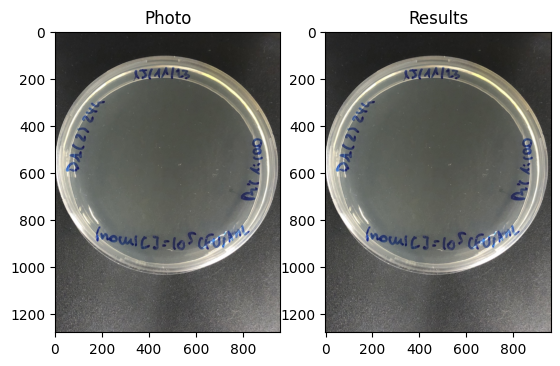

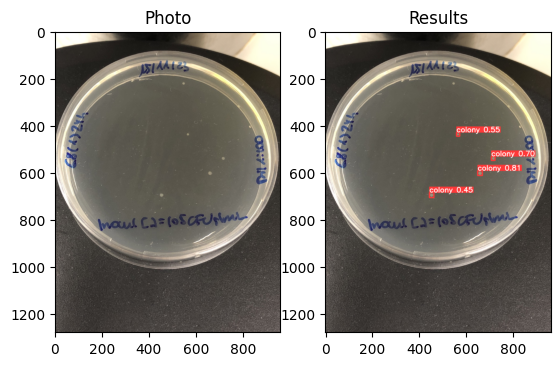

In [7]:
dict_list = []

for img_path in image_paths:
    date = img_path.split("/")[1]
    img_filename = img_path.split("/")[2]
    img_filename = img_filename.split('.')[0]
    img_filename = img_filename.split(' ')[0]
    strain = img_filename.split("_")[0]
    timePoint = img_filename.split("_")[1]
    dilutionFactorString = img_filename.split("_")[2]
    dilutionFactor = int(dilutionFactorString.split(':')[1])/int(dilutionFactorString.split(':')[0]) if ':' in dilutionFactorString else np.nan
    inoculationConcentration = img_filename.split("_")[3] if len(img_filename.split("_"))>=4 else np.nan
    volume = 0.005
    colonyCount = count_classes(model_path, img_path)['colony']
    CFUml = colonyCount * dilutionFactor / volume

    dict = {'Date': date, 
            'Strain': strain, 
            'InoculationConcentration': inoculationConcentration,
            'TimePoint': timePoint, 
            'DilutionFactor': dilutionFactor, 
            'Volume': volume,
            'ColonyCount': colonyCount,
            'CFU/ml': CFUml}
    
    dict_list.append(dict)


In [8]:
df = pd.DataFrame(dict_list)
df = df.sort_values(by = ['Date', 'Strain'])

In [9]:
df

,Date,Strain,InoculationConcentration,TimePoint,DilutionFactor,Volume,ColonyCount,CFU/ml
48,2023-08-02,C5,NaN,t0,100.0,0.005,0,0.0
55,2023-08-02,C5,NaN,t0,10.0,0.005,0,0.0
49,2023-08-02,C6,NaN,t0,100.0,0.005,0,0.0
54,2023-08-02,C6,NaN,t0,1000.0,0.005,0,0.0
47,2023-08-02,D1,NaN,t96,10.0,0.005,1,2000.0
...,...,...,...,...,...,...,...,...
14,2023-11-21,C8tanque(2),10^5,t24,100.0,0.005,0,0.0
31,2023-11-21,C8tanque(2),10^5,t24,10.0,0.005,0,0.0
7,2023-11-21,C8tanque(nofiltered),10^5,t24,10.0,0.005,2,4000.0
20,2023-11-21,C8tanque(nofiltered),10^5,t0,10.0,0.005,12,24000.0


In [10]:
df.to_excel('Colony counting output.xlsx')